# Projet P6 - Classifiez automatiquement des biens de consommation - Partie 5 : Classification supervisée
*OPENCLASSROOMS - Parcours Data Scientist - Adeline Le Ray - 05/2024*
<hr>

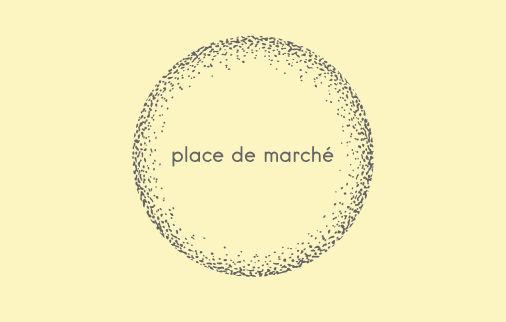

## <font color='#46abe6'>Contexte</font>
Place de marché est un site de e-commerce où des vendeurs proposent des articles à des acheteurs en postant une photo et une description.
 
Actuellement, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.
 
Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle,  il devient nécessaire d'automatiser cette tâche d‘attribution de la catégorie.
 
L'objectif de ce projet est d'étudier la faisablité d'un moteur de classification à partir de la description textuelle ou de l'image du produit.

Le présent notebook porte sur la classification des images à partir du modèle CNN sélectionné. Le modèle pré-entraîné doit être adapter la classification en catégories des images de Place de marché en réalisant du Transfert learning, ré-entraînement des dernières couches du réseau.
Seront également testées ici le gain avec Data augmentation par transformation des images du dataset.

## <font color='#46abe6'>Sommaire</font>

<span style='background:#46abe6'><span style='color:white'>**Partie 1 - Données textuelles - Analyse exploratoire des données**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 2 - Données textuelles - Feature extraction et faisabilité**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 3 - Images - Analyse exploratoire des données**</span></span>

<span style='background:#46abe6'><span style='color:white'>**Partie 4 - Images - Feature extraction et faisabilité**</span></span>

<span style='background:#d5155b'><span style='color:white'>**Partie 5 - Images - Classification**</span></span>

[Importation des librairies + fonctions + données](#1)

[Préparation des données](#2)
* [Split Train, validation and test avec stratification sur les catégories](#2_1)
* []
    
[Transfert Learning - VGG16](#3)

[Transfert Learning - DenseNet](#4)
* [Préparation des données](#4_1)
* [Data sans data augmentation, weights = None](#2_2)
* [Images nuances de gris](#2_3)
* [Data avec data augmentation, weights = None](#2_4)

[Conclusion et perspectives](#5)



<span style='background:#46abe6'><span style='color:white'>**Partie 6 - Images - Requête API**</span></span></span>

# <font color='#0a389f'>Importation librairies + fonctions + données<a class="anchor" id="1"></a></font>

## <font color='#46abe6'>Importation des librairies<a class="anchor" id="1_1"></a></font>

In [1]:
import numpy as np
import pandas as pd
import math 

# graphiques
import matplotlib.pyplot as plt
import seaborn as sns

import os
import shutil
import time
from tqdm import tqdm
import pickle

from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Importation des modèles
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.densenet import DenseNet201

In [3]:
# Version python
!python --version
# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

Python 3.11.4
numpy - 1.24.4
pandas - 2.2.2
seaborn - 0.13.2
tensorflow - 2.16.1


In [4]:
# Paramètres par défauts des graphiques
sns.set_style('whitegrid')        # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=15)     # fontsize of the axes title
plt.rc('axes', labelsize=14)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rc('font', size=13)          # controls default text sizes
width = 7
height = 5
plt.figure(figsize=(width, height))
meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'}

<Figure size 700x500 with 0 Axes>

## <font color='#46abe6'>Fonctions<a class="anchor" id="1_2"></a></font>

In [5]:
# Importez le script des fonctions
from LeRay_Adeline_7_Fonctions_communes_052024 import *

In [6]:
def preprocess_image(image, label):
    """!
    @brief Preorocess une image en appliquant une normalisation spécifique au modèle DenseNet.

    Cette fonction prend une image et son label, applique la fonction de prétraitement `preprocess_input`
    (spécifique au modèle DenseNet), et retourne l'image prétraitée avec son label.

    @param image: Image d'entrée sous forme de tableau numpy ou de tenseur (type: tf.Tensor).
    @param label: Label associé à l'image, sous forme de tenseur (type: tf.Tensor).

    @return (image, label): Une tuple contenant l'image prétraitée et son label (type: tuple).
    """
    image = preprocess_input(image)
    
    return image, label

In [7]:
def preprocess_datasets(train_dataset, validation_dataset, test_dataset):
    """ !
    @brief Preprocessing et improvement des datasets   
    Prétraiter les ensembles de données pour le modèle en appliquant une fonction de prétraitement 
    et en utilisant des techniques de chevauchement pour optimiser les performances.
    Cette fonction utilise la fonction preprocess_image.

    @ param train_dataset: L'ensemble de données d'entraînement (type: tf.data.Dataset).
    @param validation_dataset: L'ensemble de données de validation (type: tf.data.Dataset).
    @param test_dataset: L'ensemble de données de test (type: tf.data.Dataset).

    @ return: Ensemble de données d'entraînement, de validation et de test prétraités (type : tuple).
    """

    # Appliquer le prétraitement aux ensembles de données
    train_dataset_p = train_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    validation_dataset_p = validation_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    test_dataset_p = test_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Dataset.cache stocke les résultats d'un calcul en mémoire pour éviter de les recalculer à chaque epoch
    # Dataset.prefetch chevauche le prétraitement des données et l'exécution du modèle pendant la formation
    AUTOTUNE = tf.data.experimental.AUTOTUNE
    train_dataset_p = train_dataset_p.cache().prefetch(buffer_size=AUTOTUNE)
    validation_dataset_p = validation_dataset_p.cache().prefetch(buffer_size=AUTOTUNE)
    test_dataset_p = test_dataset_p.cache().prefetch(buffer_size=AUTOTUNE)

    return train_dataset_p, validation_dataset_p, test_dataset_p

In [8]:
def loss_acc_plot(fit_history, model_name):
    """!
    @brief Affiche les courbes de perte et d'exactitude pour l'entraînement et la validation d'un modèle.

    Cette fonction prend l'historique d'entraînement d'un modèle et affiche les courbes de la perte (loss)
    et de l'exactitude (accuracy) pour l'entraînement et la validation au fil des époques.

    @param fit_history: Dictionnaire avec l'historique d'entraînement du modèle (type: dict).
    @param model_name: Nom du modèle, utilisé comme titre du graphique (type: str).
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))

    plt.suptitle(f'{model_name} - Loss et Accuracy', fontsize=20)

    # Loss
    ax1.plot(fit_history['loss'], label='Train loss')
    ax1.plot(fit_history['val_loss'], label='Validation loss')
    ax1.set_xlabel('Number of epochs', fontsize=15)
    ax1.set_ylabel('Loss', fontsize=15)
    ax1.set_ylim(0, None)
    ax1.legend(fontsize=15)

    # Accuracy
    ax2.plot(fit_history['accuracy'], label='Train accuracy')
    ax2.plot(fit_history['val_accuracy'], label='Validation accuracy')
    ax2.set_xlabel('Number of epochs', fontsize=15)
    ax2.set_ylabel('Accuracy', fontsize=15)
    ax2.set_ylim(0,1)
    ax2.legend(fontsize=15)

    plt.show()

In [9]:
def eval_model(model_poids, 
               data_augment, 
               total_params,
               fit_history,
               eval_results):
    """!
    @brief Enregistrement des métriques d'évaluation du modèle.

    Cette fonction extrait le nombre d'époques, la précision d'entraînement, la précision de validation à la dernière 
    époque, et la précision sur le jeu de test pour ensuite les enregistrer dans un DataFrame global `eval_df``.

    @param model_poids: Description des poids et du modèle utilisés (type : str).
    @param data_augment: Indique si la data augmentation a été appliquée ("Yes" ou "No") (type : str).
    @param total_params: Nombre de poids du modèle (type : int).
    @param fit_history: Historique de l'entraînement du modèle (type : array-like).
    @param eval_results: Résultats de l'évaluation du modèle sur le test_dataset (type : array-like).
    
    """      
    global eval_df 
    
    # Nombre d'époques d'entraînement
    num_epochs = len(fit_history['accuracy'])

    # Précision d'entraînement à la dernière époque
    train_accuracy = round(fit_history['accuracy'][-1], 3)
    
    # Précision de validation à la dernière époque
    val_accuracy = round(fit_history['val_accuracy'][-1], 3)

    # Précision sur le jeu de test
    test_accuracy = round(eval_results[1], 3)

    # Création d'une nouvelle ligne avec les résultats à ajouter à eval_df
    new_row = pd.DataFrame({
        'Model and weights': model_poids,  # Nom du modèle et des poids utilisés
        'Data Augmentation': data_augment,  # Data augmentation appliquée ou non
        'Weights_nb': total_params,  # Nombre total de poids du modèle
        'Epoch' : num_epochs,  # Nombre total d'époques d'entraînement
        'Train_accuracy': train_accuracy,  # Précision d'entraînement finale
        'Validation_accuracy': val_accuracy,  # Précision de validation finale
        'Fit Time (s)': fit_history['training_time'],  # Temps d'entraînement (en secondes)
        'Test_accuracy': test_accuracy  # Précision sur le jeu de test
    }, index=[0])

    # Ajouter la nouvelle ligne à eval_df
    eval_df = pd.concat([eval_df, new_row], ignore_index=True)
    
    display(new_row)

In [10]:
def true_predict_labels(model, dataset):
    """!
    @brief: Fonction pour extraire les étiquettes réelles et prédites à partir d'un modèle et d'un dataset.

    Parameters:
    @param model : Le modèle entraîné utilisé pour prédire les labels (type : tf.keras.Model). 
    @param dataset : Le dataset utilisé pour obtenir les images et les labels(type : tf.data.Dataset).

    @ return: tuple: (true_labels, predict_labels) Les labels réels et prédits sous forme de tableaux NumPy.
    """

    # Initialisation des listes pour stocker les labels réels et prédits
    predict_labels = []
    true_labels = []

    # Itération sur le dataset pour prédire le label et récupérer le true label
    for images, labels in dataset:
        preds = model.predict(images)  # Utiliser le modèle entraîné pour prédire
        predict_labels.extend(np.argmax(preds, axis=1))  # Obtenir l'indice de la plus haute probabilité
        true_labels.extend(np.argmax(labels.numpy(), axis=1))  # Obtenir l'indice du true label

    # Conversion en tableaux NumPy
    predict_labels = np.array(predict_labels)
    true_labels = np.array(true_labels)

    return true_labels, predict_labels

In [11]:
def reordered_confusion_matrix(y_true, y_predict, class_names):
    """!
    @brief Calcule et visualise la matrice de confusion réordonnée.

    Cette fonction prend les vraies étiquettes et les étiquettes prédites, puis calcule et visualise la matrice 
    de confusion réordonnée en utilisant un algorithme d'affectation linéaire pour résoudre le problème d'assignation.

    @param y_true: Les vraies étiquettes (array ou list).
    @param y_predict: Les étiquettes prédites par le modèle (array ou list).
    @param class_names: Liste des catégories (list).
    """
    # Calculer la matrice de confusion
    cm = confusion_matrix(y_true, y_predict)
    
    # Calculer la matrice de coût
    s = np.max(cm)
    cost_matrix = -cm + s

    # Résoudre le problème d'assignation
    row_ind, col_ind = linear_sum_assignment(cost_matrix)

    # Réorganiser la matrice de confusion basée sur l'assignation optimale
    cm2 = cm[:, col_ind]

    # Réordonner les noms des classes
    reordered_class_names = [class_names[i] for i in col_ind]

    # Afficher la matrice de confusion
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(cm2, annot=True, fmt="d", cmap="Blues", cbar=True)
    plt.yticks(ticks=np.arange(len(class_names)) + 0.5, labels=reordered_class_names, rotation=0)
    plt.xticks(ticks=np.arange(len(class_names)), labels=reordered_class_names, rotation=45)
    plt.xlabel('Predictions')
    plt.ylabel('True category')
    plt.title("Matrice de Confusion")
    plt.show()
    
    return cm2

In [12]:
def model_score(model, confusion_matrix, l_cat):
    """!
    @brief Met à jour le df avec les scores de précision/recall pour un modèle donné.
    
    @param model: Nom du modèle (str).
    @param confusion_matrix: Matrice de confusion (numpy array).
    @param l_cat: Liste des catégories (list).
    
    @return df: DataFrame mis à jour (DataFrame).
    """
    global result_df 
    
    # Calcul de la précision par class
    precision_dict = {cat: calculate_precision_for_class(confusion_matrix, i) for i, cat in enumerate(l_cat)}
    
    # Calcul du recall par class
    recall_dict = {cat: calculate_recall_for_class(confusion_matrix, i) for i, cat in enumerate(l_cat)}
    
    # Nouvelle ligne
    new_row = {'Model': model}
    for cat in precision_dict:
        precision = precision_dict[cat]
        recall = recall_dict[cat]
        new_row.update({f'Precision / recall - {cat}': "{:.2f} / {:.2f}".format(precision, recall)})
    new_row = pd.DataFrame(new_row, index=[0])
    
    # Ajouter la nouvelle ligne à eval_df
    result_df = pd.concat([result_df, new_row],ignore_index=True)
    
    display(new_row)

In [13]:
def denormalize_image(image):
    """!
    @brief Convertit une image normalisée (prétraitée) en image RGB pour l'affichage.

    @param image: Image normalisée à dénormaliser (numpy array).
    @return image: Image dénormalisée en format [0, 255] (numpy array).
    """
    image = (image - np.min(image)) / (np.max(image) - np.min(image))  # Remettre les valeurs entre 0 et 1
    image = (image * 255).astype(np.uint8)  # Convertir en [0, 255]
    return image

def get_image_indices_by_category(true_labels, predict_labels, categories):
    """!
    @brief Retourne les indices des images correctes et incorrectes pour chaque catégorie.

    @param true_labels: Étiquettes vraies des images (list ou numpy array).
    @param predict_labels: Étiquettes prédites par le modèle (list ou numpy array).
    @param categories: Liste des catégories correspondant aux indices des labels (list).

    @return correct_images_by_category: Dictionnaire avec les indices des images correctes et incorrectes par catégorie (dict).
    """
    correct_images_by_category = {cat: {'correct': [], 'incorrect': []} for cat in categories}
    
    for i, (true, pred) in enumerate(zip(true_labels, predict_labels)):
        category = categories[true]
        if true == pred:
            correct_images_by_category[category]['correct'].append(i)
        else:
            correct_images_by_category[category]['incorrect'].append(i)
    
    return correct_images_by_category

def plot_images(images, indices, true_labels, predict_labels, categories, max_images):
    """!
    @brief Affiche un échantillon d'images pour les indices donnés avec les labels.

    @param images: Liste des images à afficher (list ou numpy array).
    @param indices: Indices des images à afficher (list).
    @param true_labels: Étiquettes vraies des images (list ou numpy array).
    @param predict_labels: Étiquettes prédites par le modèle (list ou numpy array).
    @param categories: Liste des catégories correspondant aux indices des labels (list).
    @param max_images: Nombre maximum d'images à afficher (int).
    """
    if not indices:
        return

    num_images = min(len(indices), max_images)
    
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 2, 5), tight_layout=True)
    if num_images == 1:
        axes = [axes]  # Assurer que axes est une liste même pour un seul subplot
    
    for i, idx in enumerate(indices[:max_images]):
        image = images[idx].numpy()  # Convertir au format numpy array
        image = denormalize_image(image)  # Reverser la normalisation
        true_label = true_labels[idx]
        pred_label = predict_labels[idx]
        
        axes[i].imshow(image)
        axes[i].set_title(f'{categories[pred_label]}', fontsize=15)
        axes[i].axis('off')
        
    plt.show()

def display_correct_incorrect_by_category(dataset, true_labels, predict_labels, categories, max_images=10):
    """!
    @brief Affiche un échantillon d'images par catégorie, avec 10 prédictions correctes et 10 prédictions incorrectes par catégorie.

    Cette fonction extrait les images du dataset, puis affiche jusqu'à 10 images correctes et 10 incorrectes
    par catégorie, en utilisant les étiquettes vraies et prédites.

    @param dataset: Dataset contenant les images (tf.data.Dataset).
    @param true_labels: Étiquettes vraies des images (list ou numpy array).
    @param predict_labels: Étiquettes prédites par le modèle (list ou numpy array).
    @param categories: Liste des catégories correspondant aux indices des labels (list).
    @param max_images: Nombre maximum d'images à afficher pour chaque catégorie (int).
    """
    # Convertir le dataset en liste pour accéder aux images
    images = []
    for batch in dataset:
        images.extend(batch[0])  # Extraire les images du batch
    
    # Convertir les labels et les prédictions en listes pour un accès plus facile
    true_labels = list(true_labels)
    predict_labels = list(predict_labels)
    
    # Obtenir les indices des images par catégorie
    correct_images_by_category = get_image_indices_by_category(true_labels, predict_labels, categories)
    
    # Afficher les images pour chaque catégorie
    for category, images_dict in correct_images_by_category.items():
        print(f'Catégorie {category} - Prédictions correctes')
        plot_images(images, images_dict['correct'], true_labels, predict_labels, categories, max_images)
        
        print(f'Catégorie {category} - Prédictions incorrectes')
        plot_images(images, images_dict['incorrect'], true_labels, predict_labels, categories, max_images)


## <font color='#46abe6'>Chargement des datasets<a class="anchor" id="2_3"></a></font>

In [14]:
# Paramètres
BATCH_SIZE = 32
IMG_WIDTH = 224
IMG_HEIGHT = 224
IMG_SIZE = (IMG_WIDTH, IMG_HEIGHT)
COLOR_MODE = 'rgb'
SEED = 42
EPOCHS = 10

# Chemin du répertoire source des images 
image_path = 'C:/Users/Adeline/OneDrive/Documents/5-Openclassrooms/Parcours DS/P6/Dataset+projet+prétraitement+textes+images/Flipkart/Images/'

# Répertoire où stocker les images triées par catégorie
destination_path = 'C:/Users/Adeline/Documents/5-OpenClassrooms/Parcours DS/P6/Images'
train_directory = os.path.join(destination_path, 'train')
val_directory = os.path.join(destination_path, 'validation')
test_directory = os.path.join(destination_path, 'test')

save_path = 'C:/Users/Adeline/OneDrive/Documents/5-Openclassrooms/Parcours DS/P6/best_model'

In [15]:
# Chargement des différents datasets : Train, validation et test
train_dataset = image_dataset_from_directory(train_directory,
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             color_mode=COLOR_MODE,
                                             seed=SEED,
                                             label_mode='categorical')

validation_dataset = image_dataset_from_directory(val_directory,
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             color_mode=COLOR_MODE,     
                                             seed=SEED,
                                             label_mode='categorical') 

test_dataset = image_dataset_from_directory(test_directory,
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             color_mode=COLOR_MODE,     
                                             seed=SEED,
                                             label_mode='categorical')

Found 672 files belonging to 7 classes.
Found 168 files belonging to 7 classes.
Found 210 files belonging to 7 classes.


In [16]:
# Noms de classe
class_names = train_dataset.class_names
print(class_names)

['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']


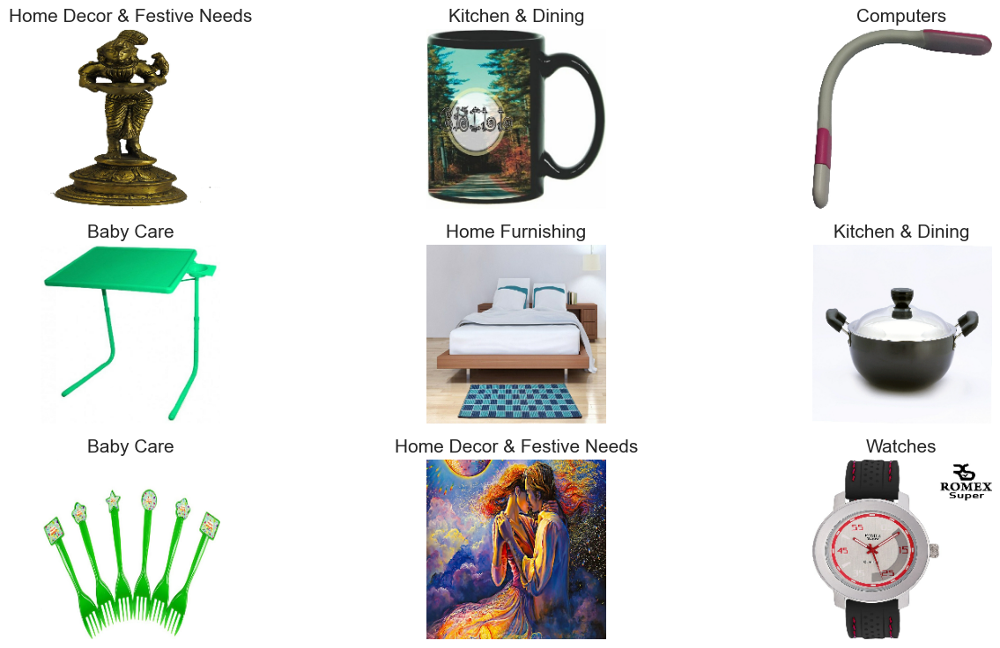

In [17]:
# Visualisation des données
plt.figure(figsize=(16, 9))
for images, labels in train_dataset.take(1):
    for i in range(9):
        num_cat = np.argmax(labels[i].numpy())
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"{class_names[num_cat]}")
        plt.axis("off")

# <font color='#0a389f'>Classification supervisée - transfer learning<a class="anchor" id="3"></a></font>

L'**accuracy** (précision) est la métrique choisie pour évaluer la performance des modèles de classification. Elle mesure la proportion de prédictions correctes effectuées par le modèle par rapport au nombre total de prédictions.
Dans notre cas, les classes sont équilibrées donc cette metrique reste pertinente.

La fonction loss retenue est **CategoricalCrossentropy** : nombre de classes > 2, classe de type categorical.

Ressources :
* [tf : Apprentissage par transfert et mise au points](https://www.tensorflow.org/guide/keras/transfer_learning?hl=fr)
* [tf : Apprentissage par transfert et perfectionnement](https://www.tensorflow.org/tutorials/images/transfer_learning?hl=fr)
* [tf :Charger et prétraiter les images](https://www.tensorflow.org/tutorials/load_data/images?hl=fr)
* [tf: Entraînement et évaluation](https://www.tensorflow.org/guide/keras/training_with_built_in_methods)
* [tf : fonctions loss](https://www.tensorflow.org/api_docs/python/tf/keras/losses)

In [18]:
# initialisation de eval_df
eval_df = pd.DataFrame()

In [19]:
# initialisation de result_df (evaluation par catégorie)
result_df = pd.DataFrame()

## <font color='#46abe6'>VGG16 - Dataset sans data augmentation, weights = 'imagenet'<a class="anchor" id="3_3"></a></font>

* **Preprocessing image**

In [20]:
# Appel de la fonction pour prétraiter les ensembles de données
from tensorflow.keras.applications.vgg16 import preprocess_input

train_dataset_vgg16, validation_dataset_vgg16, test_dataset_vgg16 = preprocess_datasets(
    train_dataset, validation_dataset, test_dataset
)


* **Chargement du best model re-entraîné**

In [21]:
# Chemin de sauvegarde du best model
VGG16_imagenet_save_path = os.path.join(save_path, 'best_VGG16_imagenet.keras')

# Charger le modèle sauvegardé
VGG16_imagenet = tf.keras.models.load_model(VGG16_imagenet_save_path)

# Afficher un résumé du modèle chargé pour vérifier
VGG16_imagenet.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         3,591 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,513,431 (59.18 MB)

 Trainable params: 266,247 (1.02 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 532,496 (2.03 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.2_Classification_Images_Training_VGG16_052024*

In [22]:
# Charger l'historique d'entraînement
with open('history_VGG16_imagenet.pkl', 'rb') as file:
    history_VGG16_imagenet = pickle.load(file)

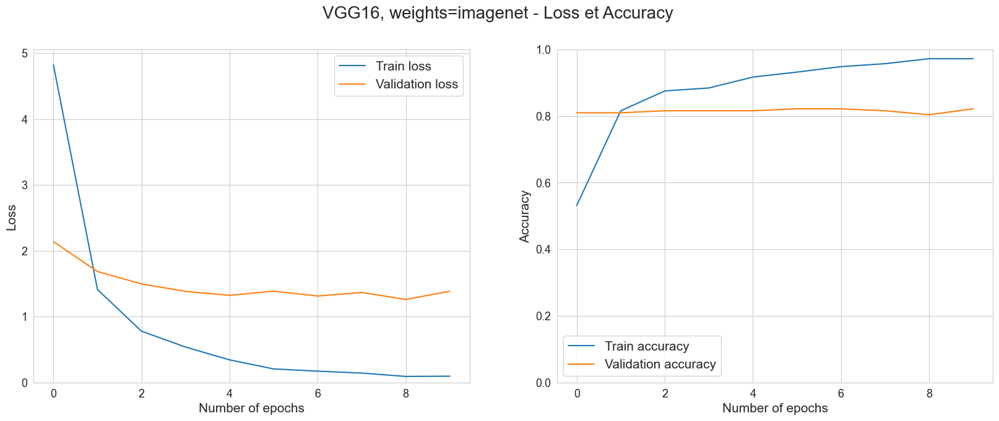

In [23]:
# Loss et accuracy
loss_acc_plot(history_VGG16_imagenet, 'VGG16, weights=imagenet')

In [24]:
# Nombre total de poids
total_params = VGG16_imagenet.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 14980935


* **Evaluation du modèle**

Ressources : [model.evaluate()](https://www.tensorflow.org/guide/keras/training_with_built_in_methods)

In [25]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_VGG16_imagenet = VGG16_imagenet.evaluate(test_dataset_vgg16, batch_size=BATCH_SIZE)
print(f"Test loss : {results_VGG16_imagenet[0]}, Test accuracy:", {results_VGG16_imagenet[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.7981 - loss: 1.2692
Test loss : 1.2290328741073608, Test accuracy: {0.8238095045089722}


In [26]:
# Enregistrement des performances du modèle
eval_model('VGG16, weights=imagenet', 
           'No', 
           total_params,
           history_VGG16_imagenet,
           results_VGG16_imagenet)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"VGG16, weights=imagenet",No,14980935,10,0.972,0.821,646.45,0.824


In [27]:
# Prédiction des labels
true_labels, predict_labels = true_predict_labels(VGG16_imagenet, test_dataset_vgg16)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


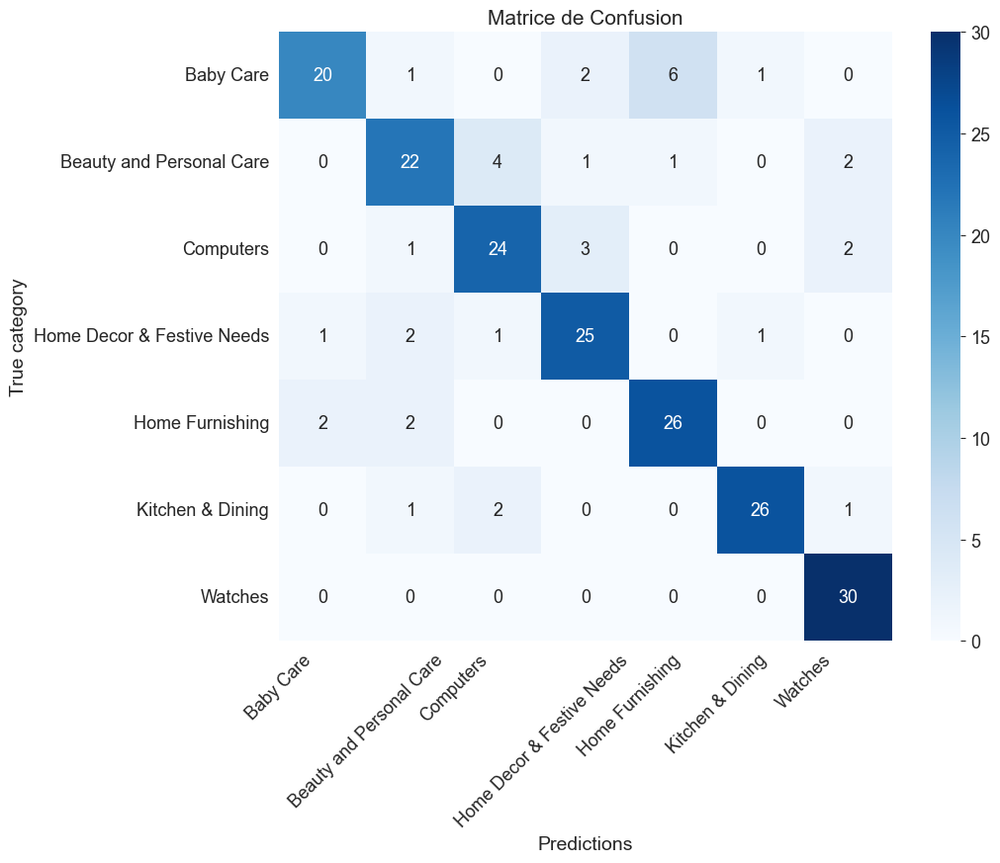

In [28]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [29]:
model_score('VGG16, weights=imagenet', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"VGG16, weights=imagenet",0.87 / 0.67,0.76 / 0.73,0.77 / 0.80,0.81 / 0.83,0.79 / 0.87,0.93 / 0.87,0.86 / 1.00


## <font color='#46abe6'>VGG16 - Dataset avec data augmentation, weights = 'imageNet'<a class="anchor" id="3_4"></a></font>

* **Chargement du best model re-entraîné**

In [30]:
# Chemin de sauvegarde du best model
VGG16_augm_save_path = os.path.join(save_path, 'best_VGG16_augm.keras')

# Charger le modèle sauvegardé
VGG16_augm = tf.keras.models.load_model(VGG16_imagenet_save_path)

# Afficher un résumé du modèle chargé pour vérifier
VGG16_augm.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         3,591 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,513,431 (59.18 MB)

 Trainable params: 266,247 (1.02 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 532,496 (2.03 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.2_Classification_Images_Training_VGG16_052024*

In [31]:
# Charger l'historique d'entraînement
with open('history_VGG16_augm.pkl', 'rb') as file:
    history_VGG16_augm = pickle.load(file)

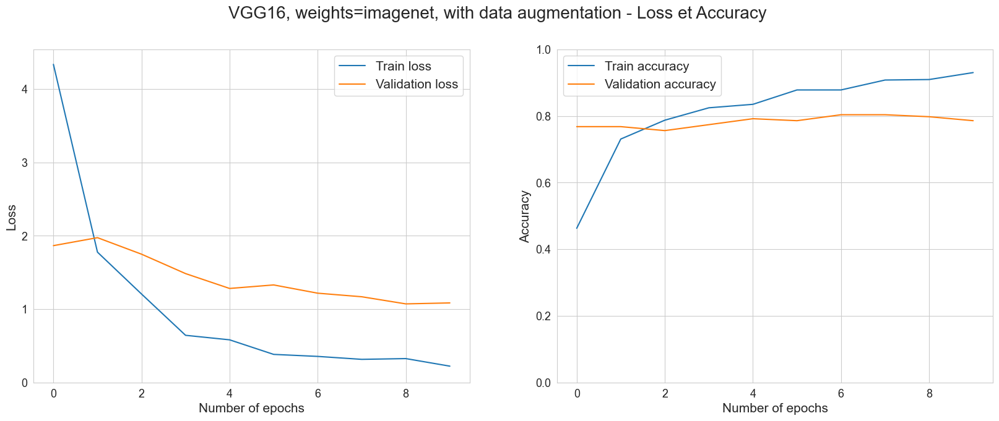

In [32]:
# Loss et accuracy
loss_acc_plot(history_VGG16_augm, 'VGG16, weights=imagenet, with data augmentation')

In [33]:
# Nombre total de poids
total_params = VGG16_augm.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 14980935


* **Evaluation du modèle**

Ressources : [model.evaluate()](https://www.tensorflow.org/guide/keras/training_with_built_in_methods)

In [34]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_VGG16_augm = VGG16_augm.evaluate(test_dataset_vgg16, batch_size=BATCH_SIZE)
print(f"Test loss : {results_VGG16_augm[0]}, Test accuracy:", {results_VGG16_augm[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.7981 - loss: 1.2692
Test loss : 1.2290328741073608, Test accuracy: {0.8238095045089722}


In [35]:
# Enregistrement des performances du modèle
eval_model('VGG16, weights=imagenet', 
           'Yes', 
           total_params,
           history_VGG16_augm,
           results_VGG16_augm)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"VGG16, weights=imagenet",Yes,14980935,10,0.93,0.786,430.53,0.824


In [36]:
# Prédictions des labels
true_labels, predict_labels = true_predict_labels(VGG16_augm, test_dataset_vgg16)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


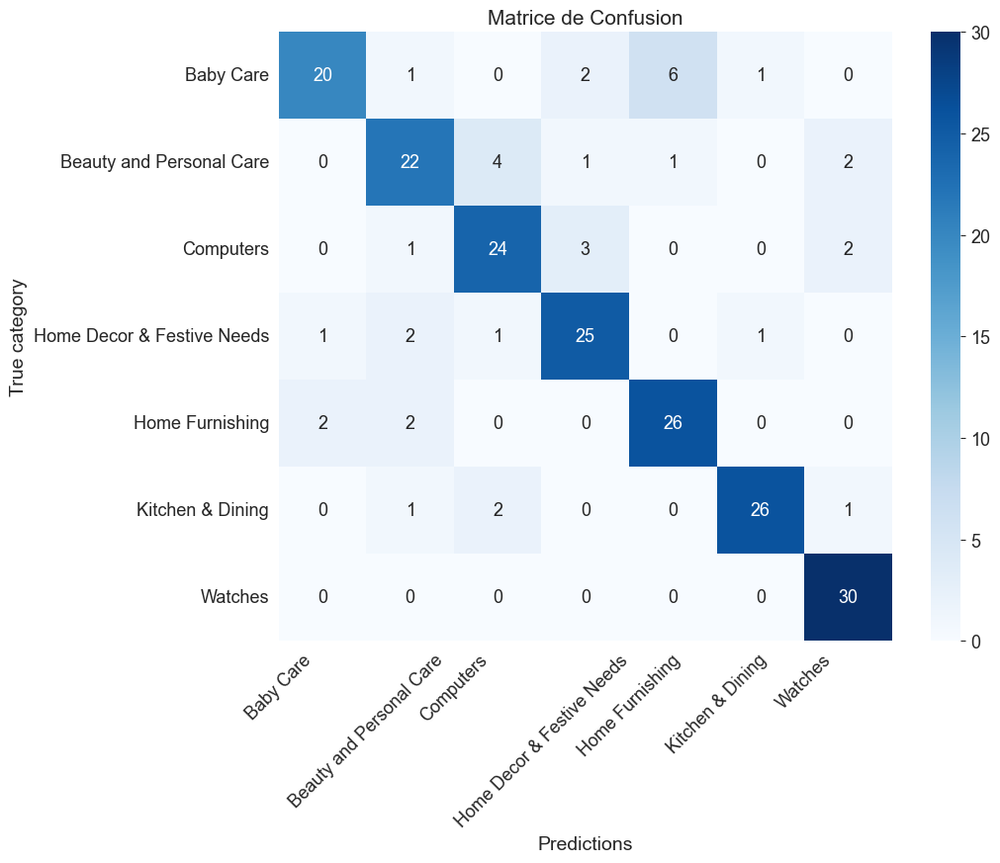

In [37]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [38]:
model_score('VGG16, weights=imagenet, with data augment', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"VGG16, weights=imagenet, with data augment",0.87 / 0.67,0.76 / 0.73,0.77 / 0.80,0.81 / 0.83,0.79 / 0.87,0.93 / 0.87,0.86 / 1.00


## <font color='#46abe6'>DenseNet - Dataset sans data augmentation, weights = None<a class="anchor" id="2_2"></a></font>
Ressources :
* [Exemple 1 de transfer learning](https://khawlajlassi.medium.com/a-guide-to-transfer-learning-with-keras-using-densenet201-48c617ceb2e2)
* [Exemple 2 de transfer learning](https://medium.com/@zeynepaslann/transfer-learning-using-densenet201-525749762ca9)

* **Preprocessing image**

In [39]:
# Appel de la fonction pour prétraiter les ensembles de données
from tensorflow.keras.applications.densenet import preprocess_input

train_dataset_dense, validation_dataset_dense, test_dataset_dense = preprocess_datasets(
    train_dataset, validation_dataset, test_dataset
)

* **Chargement du best model re-entraîné**

In [40]:
# Chemin de sauvegarde du best model
Dense_noweights_save_path = os.path.join(save_path,'best_model_noweight.keras')

# Charger le modèle sauvegardé
Dense_noweights = tf.keras.models.load_model(Dense_noweights_save_path)

# Afficher un résumé du modèle chargé pour vérifier
Dense_noweights.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 21,283,415 (81.19 MB)

 Trainable params: 987,143 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 Optimizer params: 1,974,288 (7.53 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.3_Classification_Images_Training_DenseNet_052024*

In [41]:
# Charger l'historique d'entraînement
with open('history_DenseNet_noweights.pkl', 'rb') as file:
    history_noweights = pickle.load(file)

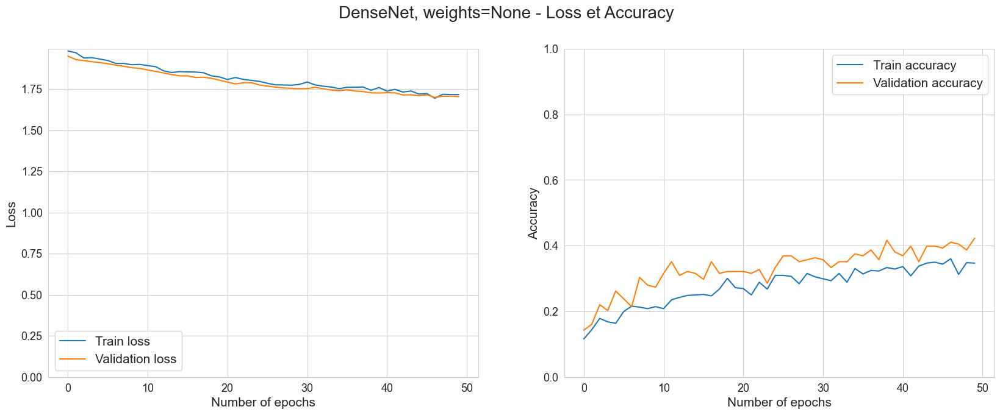

In [42]:
# Baseline model training - Loss et accuracy
loss_acc_plot(history_noweights, 'DenseNet, weights=None')

In [43]:
# Nombre total de poids
total_params = Dense_noweights.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 19309127


* **Evaluation du modèle**

In [44]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_noweights = Dense_noweights.evaluate(test_dataset_dense, batch_size=BATCH_SIZE)
print(f"Test loss : {results_noweights[0]}, Test accuracy:", {results_noweights[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.3874 - loss: 1.7357
Test loss : 1.724872350692749, Test accuracy: {0.4095238149166107}


In [45]:
# Enregistrement des performances du modèle
eval_model('DenseNet, weights=None', 
           'No', 
           total_params,
           history_noweights,
           results_noweights)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"DenseNet, weights=None",No,19309127,50,0.347,0.423,2760.8,0.41


In [46]:
# Prédiction des labels
true_labels, predict_labels = true_predict_labels(Dense_noweights, test_dataset_dense)

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


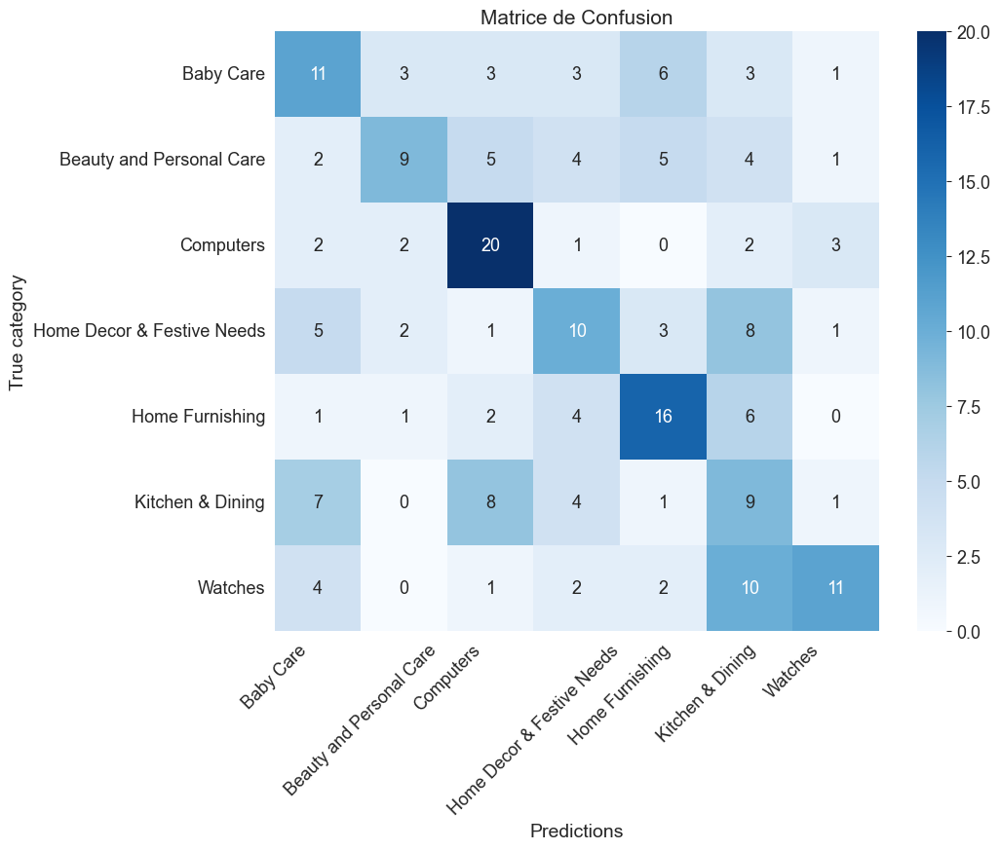

In [47]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [48]:
model_score('DenseNet, weights=None', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"DenseNet, weights=None",0.34 / 0.37,0.53 / 0.30,0.50 / 0.67,0.36 / 0.33,0.48 / 0.53,0.21 / 0.30,0.61 / 0.37


## <font color='#46abe6'>DenseNet - Dataset avec data augmentation, weights = None<a class="anchor" id="2_4"></a></font>

* **Preprocessing image**

In [49]:
# Appel de la fonction pour prétraiter les ensembles de données
from tensorflow.keras.applications.densenet import preprocess_input

train_dataset_dense, validation_dataset_dense, test_dataset_dense = preprocess_datasets(
    train_dataset, validation_dataset, test_dataset
)

* **Chargement du best model re-entraîné**

In [50]:
# Chemin de sauvegarde du best model
noweights_augm_save_path = os.path.join(save_path,'best_model_noweights_augm.keras')

# Charger le modèle sauvegardé
model_noweights_augm = tf.keras.models.load_model(noweights_augm_save_path)

# Afficher un résumé du modèle chargé pour vérifier
model_noweights_augm.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_10   │ (None, 230, 230,  │          0 │ input_layer_7[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_11   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 21,283,415 (81.19 MB)

 Trainable params: 987,143 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 Optimizer params: 1,974,288 (7.53 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.3_Classification_Images_Training_DenseNet_052024*

In [51]:
# Charger l'historique d'entraînement
with open('history_DenseNet_noweights_augm.pkl', 'rb') as file:
    history_noweights_augm = pickle.load(file)

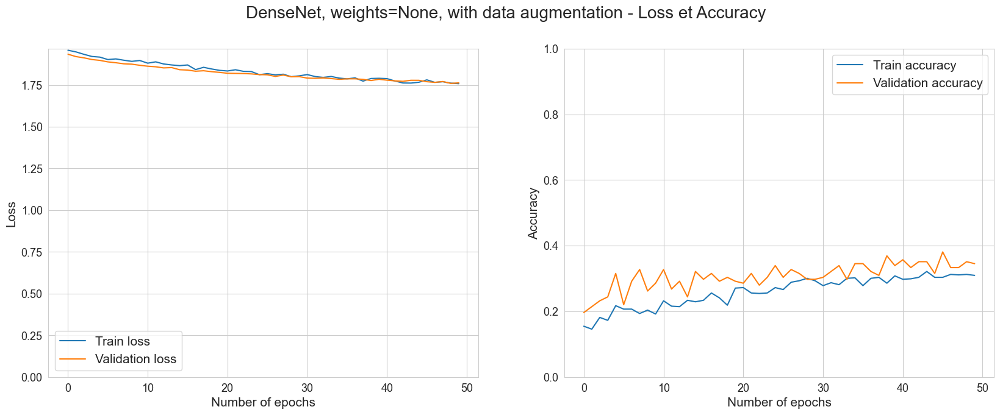

In [52]:
# Model training - Loss et accuracy
loss_acc_plot(history_noweights_augm, 'DenseNet, weights=None, with data augmentation')

In [53]:
# Nombre total de poids
total_params = model_noweights_augm.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 19309127


* **Evaluation du modèle**

In [54]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_noweights_augm = model_noweights_augm.evaluate(test_dataset_dense, batch_size=BATCH_SIZE)
print(f"Test loss : {results_noweights_augm[0]}, Test accuracy:", {results_noweights_augm[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.8558 - loss: 0.4693
Test loss : 0.4777891933917999, Test accuracy: {0.8571428656578064}


In [55]:
# Enregistrement des performances du modèle
eval_model('DenseNet, weights=None', 
           'Yes', 
           total_params,
           history_noweights_augm,
           results_noweights_augm)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"DenseNet, weights=None",Yes,19309127,50,0.31,0.345,2918.75,0.857


In [56]:
# Prédiction des labels
true_labels, predict_labels = true_predict_labels(model_noweights_augm, test_dataset_dense)

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


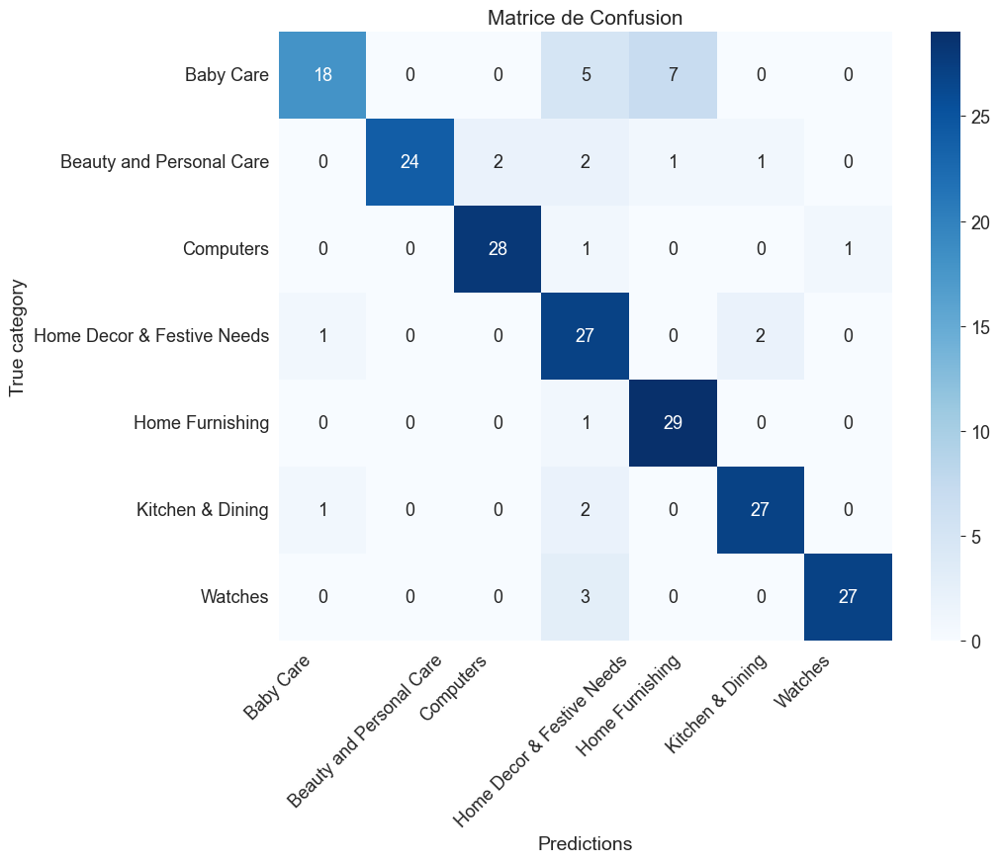

In [57]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [58]:
model_score('DenseNet, weights=none, with data augment', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"DenseNet, weights=none, with data augment",0.90 / 0.60,1.00 / 0.80,0.93 / 0.93,0.66 / 0.90,0.78 / 0.97,0.90 / 0.90,0.96 / 0.90


## <font color='#46abe6'>DenseNet - Dataset sans data augmentation, weights = ImageNet<a class="anchor" id="2_3"></a></font>

* **Chargement du best model re-entraîné**

In [59]:
# Chemin de sauvegarde du best model
imagenet_save_path = os.path.join(save_path,'best_model_imagenet.keras')

# Charger le modèle sauvegardé
model_imagenet = tf.keras.models.load_model(imagenet_save_path)

# Afficher un résumé du modèle chargé pour vérifier
model_imagenet.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer_10[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 21,283,415 (81.19 MB)

 Trainable params: 987,143 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 Optimizer params: 1,974,288 (7.53 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.3_Classification_Images_Training_DenseNet_052024*

In [60]:
# Charger l'historique d'entraînement
with open('history_DenseNet_imagenet.pkl', 'rb') as file:
    history_imagenet = pickle.load(file)

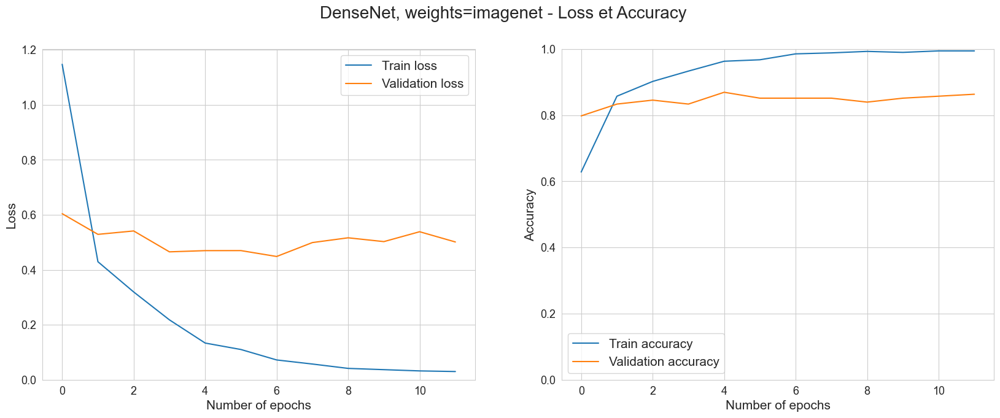

In [61]:
# Baseline model training - Loss et accuracy
loss_acc_plot(history_imagenet, 'DenseNet, weights=imagenet')

In [62]:
# Nombre total de poids
total_params = model_imagenet.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 19309127


* **Evaluation du modèle**

In [63]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_imagenet = model_imagenet.evaluate(test_dataset_dense, batch_size=BATCH_SIZE)
print(f"Test loss : {results_imagenet[0]}, Test accuracy:", {results_imagenet[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.8458 - loss: 0.4144
Test loss : 0.43944603204727173, Test accuracy: {0.8476190567016602}


In [64]:
# Enregistrement des performances du modèle
eval_model('DenseNet, weights=imagenet', 
           'No', 
           total_params,
           history_imagenet,
           results_imagenet)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"DenseNet, weights=imagenet",No,19309127,12,0.994,0.863,722.53,0.848


In [65]:
# Prédiction labels
true_labels, predict_labels = true_predict_labels(model_imagenet, test_dataset_dense)

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


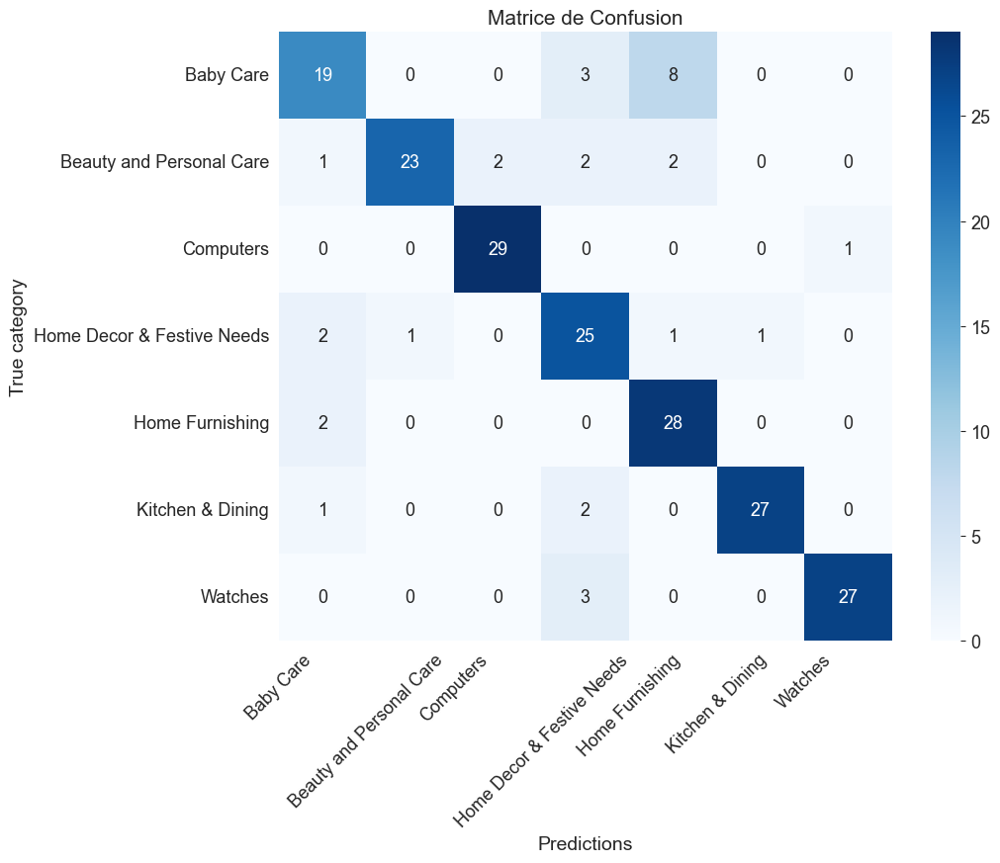

In [66]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [67]:
model_score('DenseNet, weights=imagenet', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"DenseNet, weights=imagenet",0.76 / 0.63,0.96 / 0.77,0.94 / 0.97,0.71 / 0.83,0.72 / 0.93,0.96 / 0.90,0.96 / 0.90


## <font color='#46abe6'>DenseNet - Dataset avec data augmentation, weights = 'imageNet'<a class="anchor" id="2_5"></a></font>

* **Chargement du best model re-entraîné**

In [68]:
# Chemin de sauvegarde du best model
imagenet_augm_save_path = os.path.join(save_path,'best_model_imagenet_augm.keras')

# Charger le modèle sauvegardé
model_imagenet_augm = tf.keras.models.load_model(imagenet_augm_save_path)

# Afficher un résumé du modèle chargé pour vérifier
model_imagenet_augm.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ base_model (Sequential)         │ (None, 7, 7, 1920)     │    18,321,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 1920)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │       983,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 7)              │         3,591 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,283,415 (81.19 MB)

 Trainable params: 987,143 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 Optimizer params: 1,974,288 (7.53 MB)

* **Entraînement du modèle**

*Entraînement du modèle : voir Notebook LeRay_Adeline_5.3_Classification_Images_Training_DenseNet_052024*

In [69]:
# Charger l'historique d'entraînement
with open('history_DenseNet_imagenet_augm.pkl', 'rb') as file:
    history_imagenet_augm = pickle.load(file)

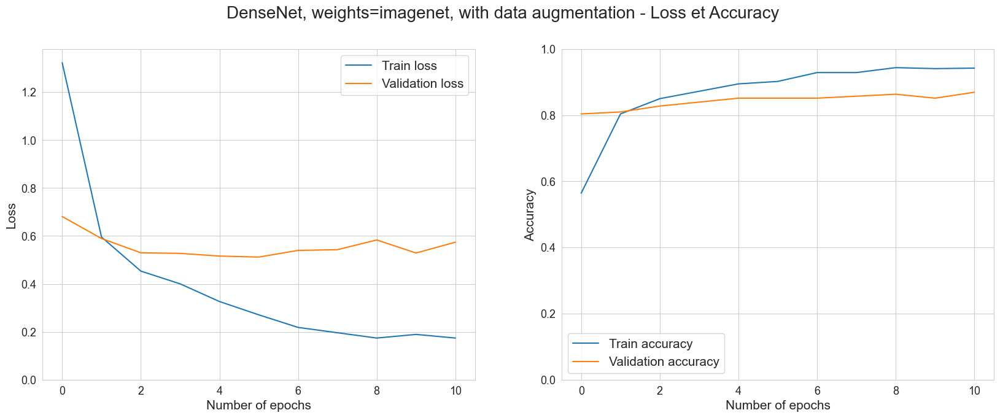

In [70]:
# Model training - Loss et accuracy
loss_acc_plot(history_imagenet_augm, 'DenseNet, weights=imagenet, with data augmentation')

In [71]:
# Nombre total de poids
total_params = model_noweights_augm.count_params()
print(f'Nombre total de poids : {total_params}')

Nombre total de poids : 19309127


* **Evaluation du modèle**

In [72]:
# Evaluer le modèle sur le test_dataset 
print("Evaluation sur le test_dataset")
results_imagenet_augm = model_imagenet_augm.evaluate(test_dataset_dense, batch_size=BATCH_SIZE)
print(f"Test loss : {results_imagenet_augm[0]}, Test accuracy:", {results_imagenet_augm[1]})

Evaluation sur le test_dataset
7/7 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.8410 - loss: 0.5238
Test loss : 0.504923403263092, Test accuracy: {0.8571428656578064}


In [73]:
# Enregistrement des performances du modèle
eval_model('DenseNet, weights=imagenet', 
           'Yes', 
           total_params,
           history_imagenet_augm,
           results_imagenet_augm)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"DenseNet, weights=imagenet",Yes,19309127,11,0.942,0.869,688.33,0.857


In [74]:
# Prédiction des labels
true_labels, predict_labels = true_predict_labels(model_imagenet_augm, test_dataset_dense)

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


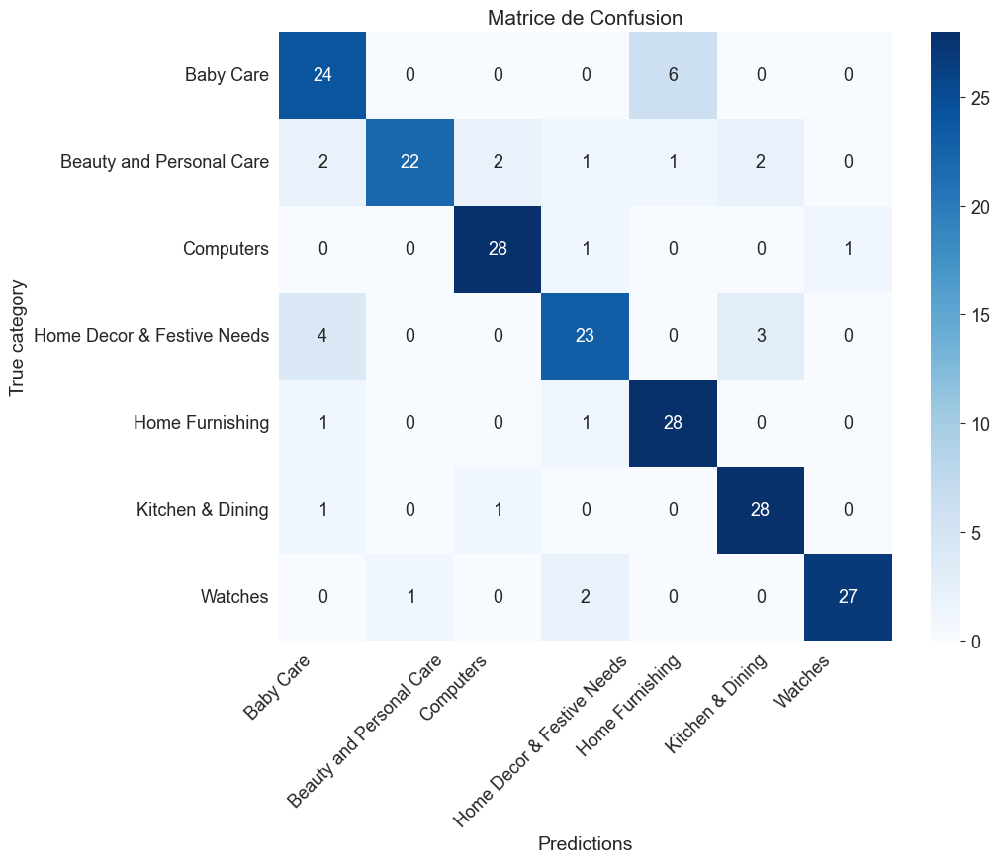

In [75]:
# Matrice de confusion
cm = reordered_confusion_matrix(true_labels, predict_labels, class_names)

In [76]:
model_score('DenseNet, weights=imagenet, with data augment', cm, class_names)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"DenseNet, weights=imagenet, with data augment",0.75 / 0.80,0.96 / 0.73,0.90 / 0.93,0.82 / 0.77,0.80 / 0.93,0.85 / 0.93,0.96 / 0.90


Catégorie Baby Care - Prédictions correctes


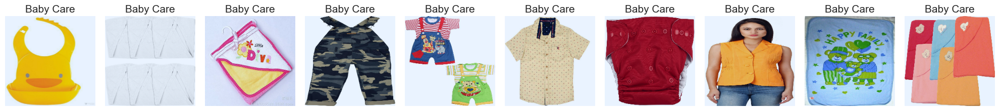

Catégorie Baby Care - Prédictions incorrectes


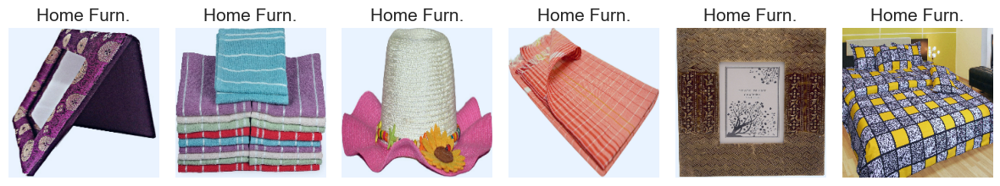

Catégorie Beauty - Prédictions correctes


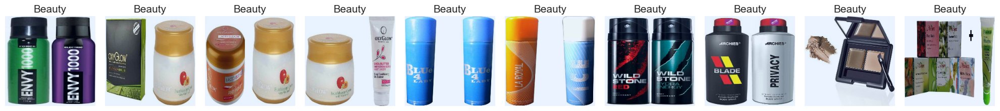

Catégorie Beauty - Prédictions incorrectes


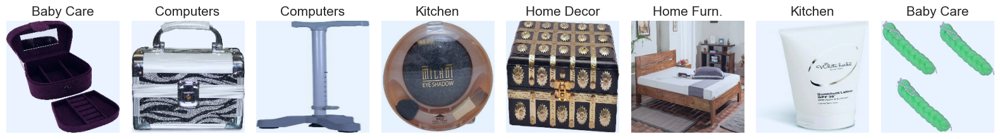

Catégorie Computers - Prédictions correctes


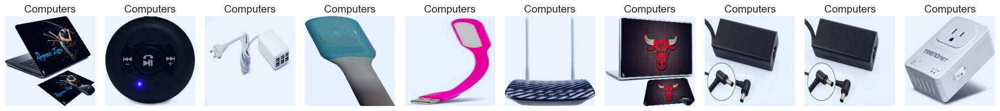

Catégorie Computers - Prédictions incorrectes


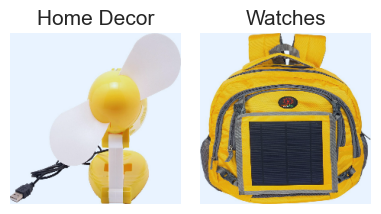

Catégorie Home Decor - Prédictions correctes


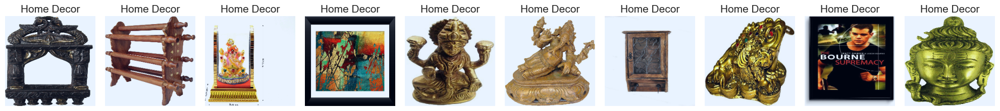

Catégorie Home Decor - Prédictions incorrectes


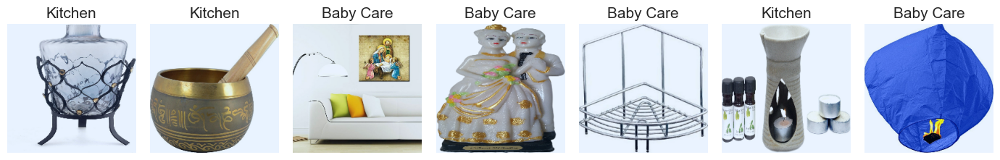

Catégorie Home Furn. - Prédictions correctes


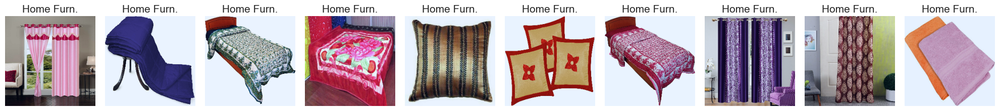

Catégorie Home Furn. - Prédictions incorrectes


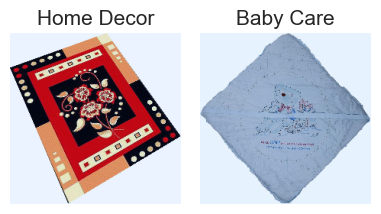

Catégorie Kitchen - Prédictions correctes


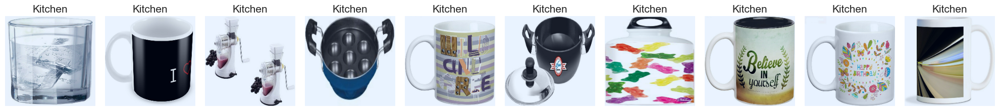

Catégorie Kitchen - Prédictions incorrectes


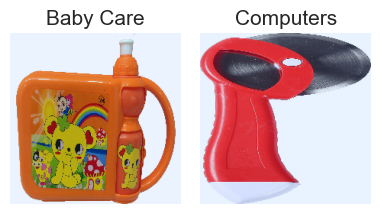

Catégorie Watches - Prédictions correctes


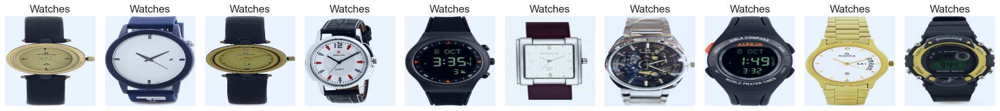

Catégorie Watches - Prédictions incorrectes


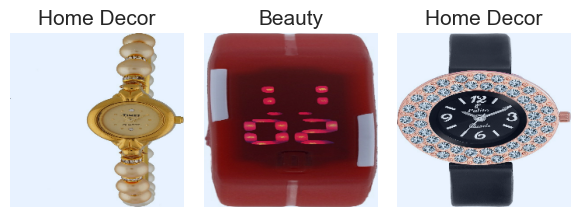

In [77]:
# Affichage des prédictions des True Positive et False negative
categories = ['Baby Care', 'Beauty', 'Computers', 'Home Decor', 'Home Furn.', 'Kitchen', 'Watches'] # Noms plus courts
display_correct_incorrect_by_category(test_dataset_dense, true_labels, predict_labels, categories)


# <font color='#0a389f'>Conclusion & Perspectives<a class="anchor" id="3"></a></font>

## Synthèse des résultats

In [78]:
display(eval_df)

,Model and weights,Data Augmentation,Weights_nb,Epoch,Train_accuracy,Validation_accuracy,Fit Time (s),Test_accuracy
0,"VGG16, weights=imagenet",No,14980935,10,0.972,0.821,646.45,0.824
1,"VGG16, weights=imagenet",Yes,14980935,10,0.930,0.786,430.53,0.824
2,"DenseNet, weights=None",No,19309127,50,0.347,0.423,2760.80,0.410
3,"DenseNet, weights=None",Yes,19309127,50,0.310,0.345,2918.75,0.857
4,"DenseNet, weights=imagenet",No,19309127,12,0.994,0.863,722.53,0.848
5,"DenseNet, weights=imagenet",Yes,19309127,11,0.942,0.869,688.33,0.857


Nous pouvons observer que la data augmentation a permis d'améliorer les résultats du modèle.

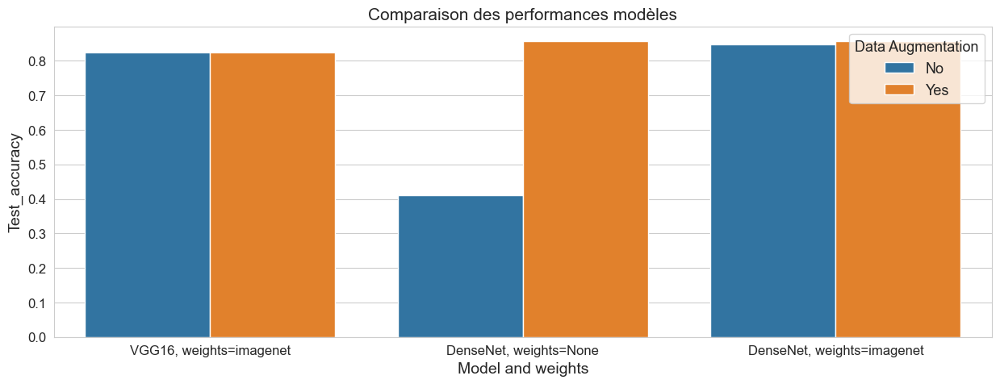

In [79]:
# Représentation des résultats
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax = sns.barplot(data=eval_df, x='Model and weights', y='Test_accuracy', hue='Data Augmentation')
ax.set_title('Comparaison des performances modèles')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
plt.show()

In [80]:
display(result_df)

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
0,"VGG16, weights=imagenet",0.87 / 0.67,0.76 / 0.73,0.77 / 0.80,0.81 / 0.83,0.79 / 0.87,0.93 / 0.87,0.86 / 1.00
1,"VGG16, weights=imagenet, with data augment",0.87 / 0.67,0.76 / 0.73,0.77 / 0.80,0.81 / 0.83,0.79 / 0.87,0.93 / 0.87,0.86 / 1.00
2,"DenseNet, weights=None",0.34 / 0.37,0.53 / 0.30,0.50 / 0.67,0.36 / 0.33,0.48 / 0.53,0.21 / 0.30,0.61 / 0.37
3,"DenseNet, weights=none, with data augment",0.90 / 0.60,1.00 / 0.80,0.93 / 0.93,0.66 / 0.90,0.78 / 0.97,0.90 / 0.90,0.96 / 0.90
4,"DenseNet, weights=imagenet",0.76 / 0.63,0.96 / 0.77,0.94 / 0.97,0.71 / 0.83,0.72 / 0.93,0.96 / 0.90,0.96 / 0.90
5,"DenseNet, weights=imagenet, with data augment",0.75 / 0.80,0.96 / 0.73,0.90 / 0.93,0.82 / 0.77,0.80 / 0.93,0.85 / 0.93,0.96 / 0.90


In [81]:
display(result_df[result_df['Model'].str.contains('DenseNet, weights=imagenet')])

,Model,Precision / recall - Baby Care,Precision / recall - Beauty and Personal Care,Precision / recall - Computers,Precision / recall - Home Decor & Festive Needs,Precision / recall - Home Furnishing,Precision / recall - Kitchen & Dining,Precision / recall - Watches
4,"DenseNet, weights=imagenet",0.76 / 0.63,0.96 / 0.77,0.94 / 0.97,0.71 / 0.83,0.72 / 0.93,0.96 / 0.90,0.96 / 0.90
5,"DenseNet, weights=imagenet, with data augment",0.75 / 0.80,0.96 / 0.73,0.90 / 0.93,0.82 / 0.77,0.80 / 0.93,0.85 / 0.93,0.96 / 0.90


## Perspectives
* Data augmentation :
    * Test avec ImageDataGenerator 
    * Transformation en fonction des produits : certaines transformations ne sont pas réalistes pour tous les produits. Par exemple, les produits Beauty Care, tubes / flacons, sont toujours dans le même sens. Par contre, certains produits Computers peuvent être inclinés ou vus de profil.
    * Nouvelles images à partir de bases de données (requêtes API). Exemples de bases de données possibles :
        * [pexel API](https://www.pexels.com/fr-fr/)
        * [Liste d'API pour des images](https://writingstudio.com/blog/image-apis/)
        * Cependant avec l'utilisation de nouvelles images, un traitement des images sera nécessaire par exemple pour détourer et ajouter un fond blanc.
        * Attention à la propriété intellectuelle

* Analyse complémentaires 
    * [Class Activation Maps](https://www.pinecone.io/learn/class-activation-maps/) : Visualiser où le modèle concentre son attention
    * Analyse des filtres des couches convolutionnelles : Comprendre comment le modèle apprend

* Tester d'autres modèles :
    * [One Shot](https://medium.com/data-by-saegus/classification-dimages-du-deep-learning-classique-au-one-shot-learning-87f39ffbf00d) / [Few shot Learning](https://www.analyticsvidhya.com/blog/2021/05/an-introduction-to-few-shot-learning/) (1 à n produit(s) par sous-catégorie) 
    * [Ensemble Learning](https://machinelearningmastery.com/tour-of-ensemble-learning-algorithms/) (systèmes de votes)   
    * [Multimodal Learning](https://vaclavkosar.com/ml/Multimodal-Image-Text-Classification) (combiner Texte + Image)
    * [Curriculum Learning](https://towardsdatascience.com/applying-curriculum-learning-to-medical-images-184275c52350)   (apprentissage progressif,+ simple -> + complexe)